<a href="https://colab.research.google.com/github/shailavij/ML-Projects/blob/master/Sales_Forecasting_US_Retail_store.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import os
from datetime import datetime
import pandas as pd
import plotly.express as px
from fbprophet import Prophet

mpl.rcParams['figure.figsize'] = (10,8)
mpl.rcParams['axes.grid'] = False

In [ ]:
# Read data
df= pd.read_csv('training_Sales.csv')

In [ ]:
df.head(10)

,Date,Value
0,2013-11-07 13:00:00,830
1,2013-11-07 13:15:00,885
2,2013-11-07 13:30:00,938
3,2013-11-07 13:45:00,804
4,2013-11-07 14:00:00,793
5,2013-11-07 14:30:00,730
6,2013-11-07 14:45:00,727
7,2013-11-07 16:00:00,729
8,2013-11-07 18:00:00,889
9,2013-11-07 18:15:00,744


In [ ]:
# Convert Date column into Datetime format
df['Date']= pd.to_datetime(df['Date'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67058 entries, 0 to 67057
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    67058 non-null  datetime64[ns]
 1   Value   67058 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 1.0 MB


In [ ]:
df.shape

(67058, 2)

In [ ]:
# check for Null value
df.isnull().sum()

Date     0
Value    0
dtype: int64

There is no null value in given data.

#Exploratory Data Analysis

In [ ]:
fig = px.line(df, x='Date', y='Value', title='US Retail Store Sales forecast')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
                     dict(count=1, label='1y', step='year', stepmode='backward'),
                     dict(count=2, label='2y', step='year', stepmode='backward'),
                     dict(count=3, label='3y', step='year', stepmode='backward'),
                     dict(count=3, label='1m', step='month', stepmode='backward'),
                      dict(count=3, label='1d', step='day', stepmode='backward'),
                     dict(step='all')
        ])
    )
)
fig.show()

In [ ]:
# To set Date as index column
df2= df.set_index('Date')
df2.head()

,Value
Date,
2013-11-07 13:00:00,830
2013-11-07 13:15:00,885
2013-11-07 13:30:00,938
2013-11-07 13:45:00,804
2013-11-07 14:00:00,793


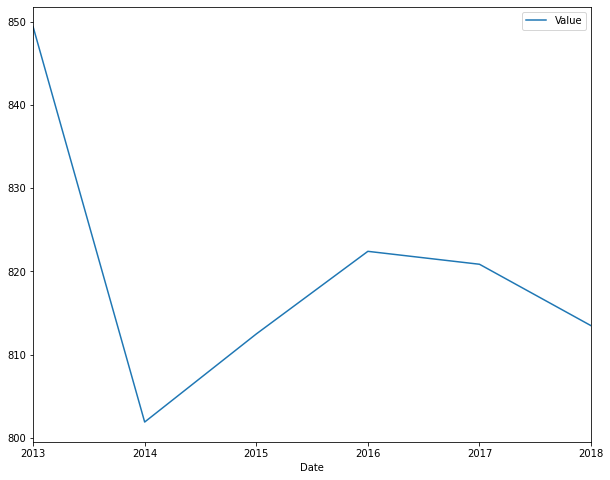

In [ ]:
# Explore yearlywise data
df2.resample('Y').mean().plot()

In [ ]:
# Explore monthlywise data
df2.resample('M').mean()

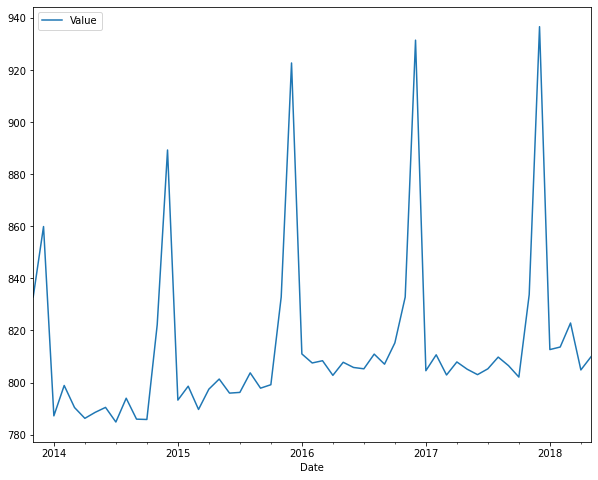

In [ ]:
# Monthly wise plot
df2.resample('M').mean().plot()

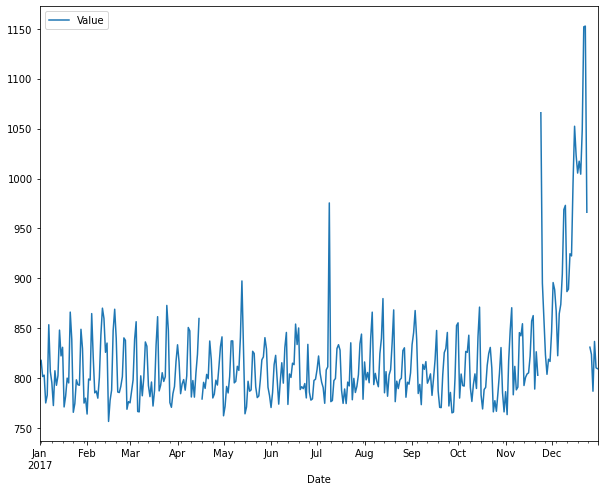

In [ ]:
# Daily wise plot
df2['2017'].resample('D').mean().plot()

In [ ]:
df1= df.copy()

In [ ]:
sale_df = df[['Date', 'Value']].rename({'Date': 'ds',
                                               'Value': 'y'}, axis='columns')

In [ ]:
sale_df

,ds,y
0,2013-11-07 13:00:00,830
1,2013-11-07 13:15:00,885
2,2013-11-07 13:30:00,938
3,2013-11-07 13:45:00,804
4,2013-11-07 14:00:00,793
...,...,...
67053,2018-05-06 18:00:00,772
67054,2018-05-06 18:15:00,872
67055,2018-05-06 18:30:00,753
67056,2018-05-06 18:45:00,793


In [ ]:
sale_df.tail(5)

,ds,y
67053,2018-05-06 18:00:00,772
67054,2018-05-06 18:15:00,872
67055,2018-05-06 18:30:00,753
67056,2018-05-06 18:45:00,793
67057,2018-05-06 19:00:00,759


In [ ]:
# from year 2013 to 2017 considered for Train data, 
train = sale_df[(sale_df['ds']>= '2013-11-07')&(sale_df['ds']<='2017-12-31')]
test =sale_df[(sale_df['ds']>'2017-12-31')]

In [ ]:
train.shape

(61778, 2)

In [ ]:
test.shape

(5280, 2)

In [ ]:
model = Prophet(interval_width=0.95,yearly_seasonality=True)

In [ ]:
model.fit(train)

In [ ]:
# model parameters
model.params

{'beta': array([[ 8.21834457e-04,  3.42176366e-03, -1.51001564e-03,
          2.90292356e-03, -2.53047183e-03,  2.10708468e-03,
         -2.47796640e-03,  7.12158133e-04, -2.19342584e-03,
          4.21226633e-04, -2.27122212e-03,  1.58088777e-04,
         -1.61591625e-03, -2.70529489e-04, -1.80049938e-03,
         -2.10645712e-04, -1.30397127e-03, -1.53700902e-04,
         -1.27543438e-03, -8.48651446e-04,  2.68482727e-03,
         -2.52883157e-03, -1.35329608e-03,  4.93389862e-04,
         -2.32965302e-05, -2.91112711e-04,  1.40297034e-02,
          7.57702319e-03,  2.07577721e-02, -6.54905985e-03,
          2.11744408e-03, -1.35029027e-02, -2.73252938e-03,
         -3.12317456e-03]]),
 'delta': array([[ 0.45079005, -0.13655245,  0.0387026 ,  0.01594297, -0.01031878,
          0.01622037, -0.11326481,  0.04238221,  0.02743621,  0.03468122,
         -0.00296842,  0.01841542, -0.00827163, -0.00583637, -0.07856106,
         -0.03028524,  0.06691215,  0.03438156,  0.00722407,  0.01312152

In [ ]:
future = model.make_future_dataframe(periods=300, freq='15min')
future.head()

,ds
0,2013-11-07 13:00:00
1,2013-11-07 13:15:00
2,2013-11-07 13:30:00
3,2013-11-07 13:45:00
4,2013-11-07 14:00:00


In [ ]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
62073,2018-01-02 23:15:00,760.274550,579.425990,928.752500
62074,2018-01-02 23:30:00,768.846914,603.137701,930.263165
62075,2018-01-02 23:45:00,782.421189,611.529550,941.469446
62076,2018-01-03 00:00:00,801.213647,642.950547,980.557193
62077,2018-01-03 00:15:00,825.225208,656.268820,1002.579307


In [ ]:
sale_df1 = pd.concat([sale_df.set_index('ds')['y'], forecast.set_index('ds')['yhat']],axis=1)

In [ ]:
sale_df1.head(10)

,y,yhat
ds,,
2013-11-07 13:00:00,830.0,841.850608
2013-11-07 13:15:00,885.0,843.067761
2013-11-07 13:30:00,938.0,843.882499
2013-11-07 13:45:00,804.0,844.338750
2013-11-07 14:00:00,793.0,844.446760
2013-11-07 14:30:00,730.0,843.531190
2013-11-07 14:45:00,727.0,842.430279
2013-11-07 16:00:00,729.0,829.740212
2013-11-07 18:00:00,889.0,803.875830


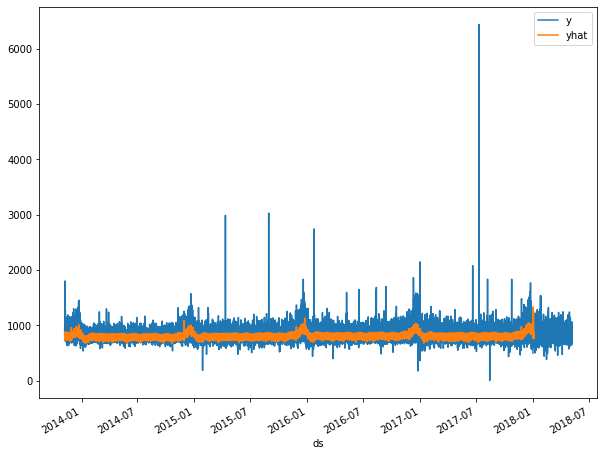

In [ ]:
sale_df1.plot()

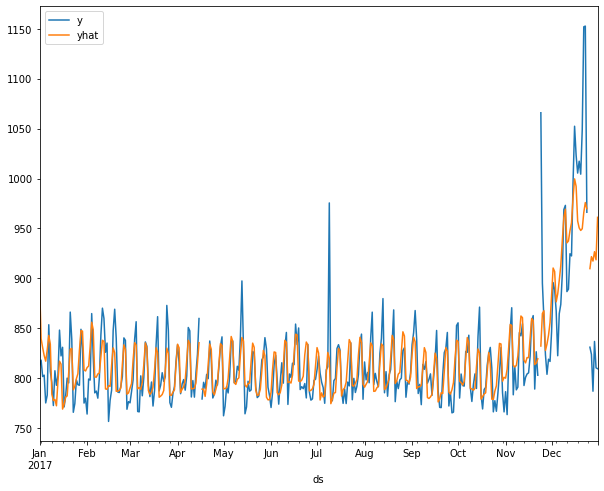

In [ ]:
sale_df1['2017'].resample('D').mean().plot()

In [ ]:
future2 = model.make_future_dataframe(periods =24, freq='60min')
future2.tail()

,ds
61797,2017-12-31 17:15:00
61798,2017-12-31 18:15:00
61799,2017-12-31 19:15:00
61800,2017-12-31 20:15:00
61801,2017-12-31 21:15:00


In [ ]:
forecast_H = model.predict(future2)
forecast_H[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
61797,2017-12-31 17:15:00,905.924182,728.101205,1090.250322
61798,2017-12-31 18:15:00,894.456583,727.368464,1062.131943
61799,2017-12-31 19:15:00,888.563000,716.371708,1048.352838
61800,2017-12-31 20:15:00,875.664601,707.157402,1039.575655
61801,2017-12-31 21:15:00,844.623448,679.983019,1007.756569


In [ ]:
sale_df2 = pd.concat([sale_df.set_index('ds')['y'], forecast_H.set_index('ds')['yhat']],axis=1)

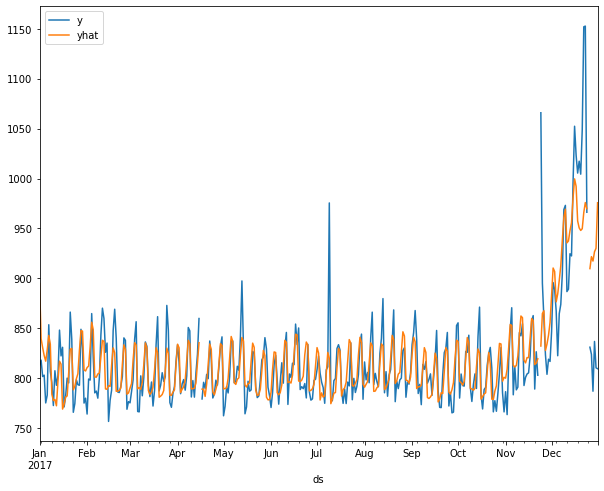

In [ ]:
sale_df2['2017'].resample('D').mean().plot()

In [ ]:
forecast_H.head(10)

In [ ]:
from fbprophet.plot import plot_plotly
import plotly.offline as py

fig= plot_plotly(model, forecast_H)
py.iplot(fig)

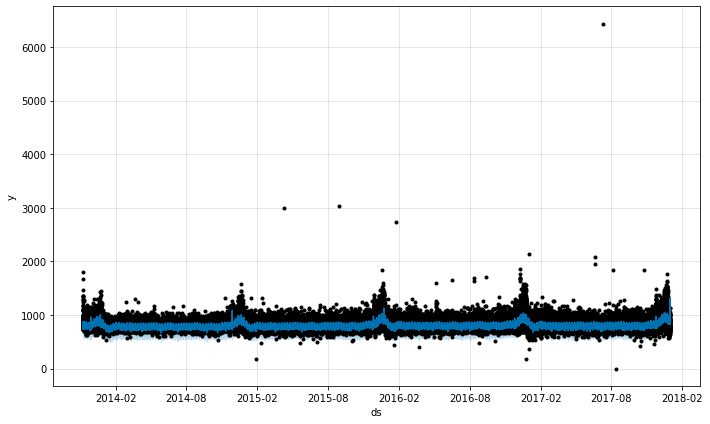

In [ ]:
fig1 = model.plot(forecast_H)

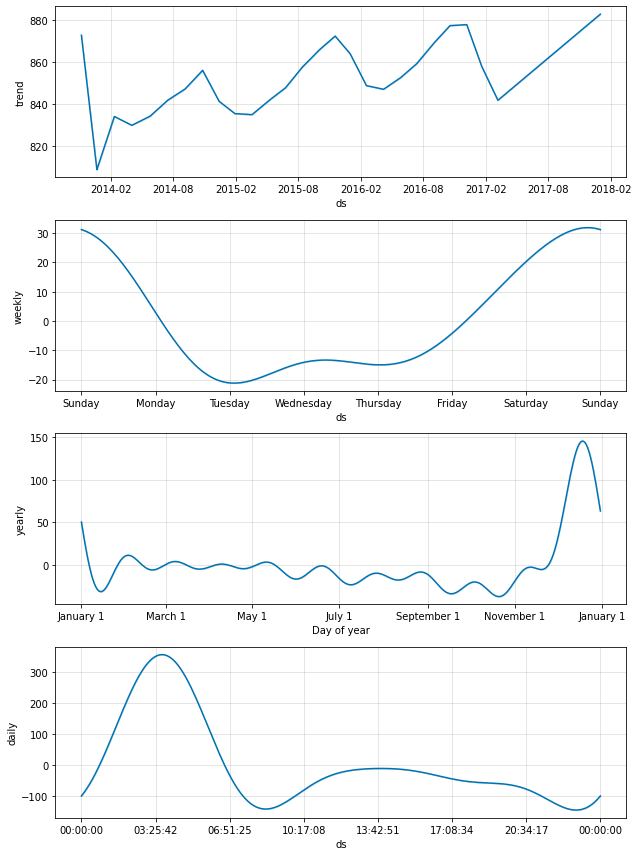

In [ ]:
fig2 = model.plot_components(forecast_H)

Sales forecast based on seasonality holiday Sales 

In [ ]:
holiday_sale = pd.DataFrame({
   'holiday': 'dec_jan_sale',
   'ds': pd.to_datetime(['2019-12-31', '2018-12-31', '2017-12-31',
                         '2016-12-31', '2015-12-31', '2014-12-31',
                         '2013-12-31' ]),
  'lower_window':0,
  'upper_window':1, 
})

In [ ]:
model2 = Prophet(interval_width=0.95, seasonality_mode='multiplicative',
                 holidays=holiday_sale)

In [ ]:
model2.fit(train)

In [ ]:
forecast_s= model2.predict(future)
forecast_s[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
62073,2018-01-02 23:15:00,763.859866,594.042844,936.794021
62074,2018-01-02 23:30:00,773.288530,603.112359,939.709826
62075,2018-01-02 23:45:00,788.018498,613.661414,963.568953
62076,2018-01-03 00:00:00,808.264467,637.725245,981.681150
62077,2018-01-03 00:15:00,834.012254,668.351534,1009.649575


In [ ]:
sale_df3=pd.concat([sale_df.set_index('ds')['y'], forecast_s.set_index('ds')['yhat']],axis=1)

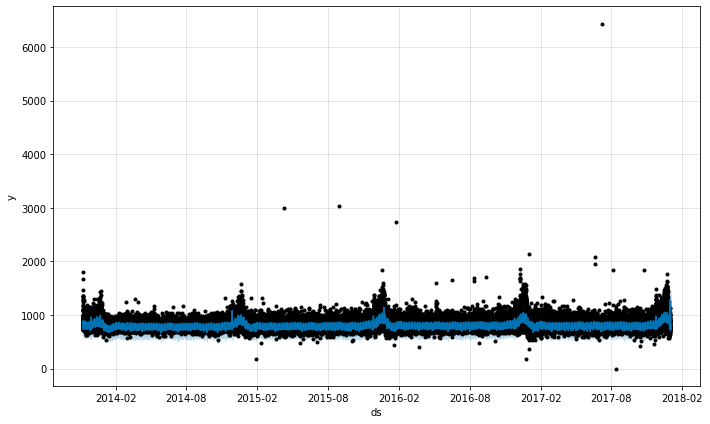

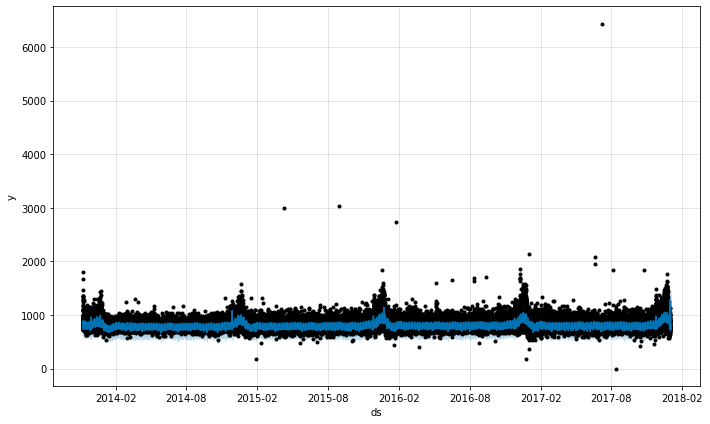

In [ ]:
 model.plot(forecast_s)

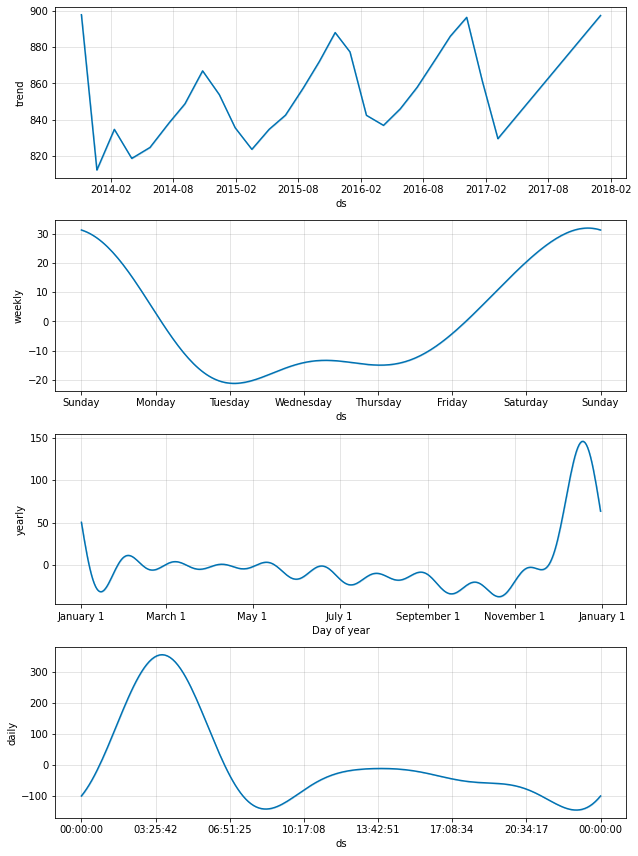

In [ ]:
fig3 = model.plot_components(forecast_s)

In [ ]:
# Validation
from fbprophet.diagnostics import  cross_validation
cv_results = cross_validation(model= model ,initial = '750 days',horizon= '365 days')

INFO:fbprophet:Making 3 forecasts with cutoffs between 2015-12-31 21:15:00 and 2016-12-30 21:15:00


In [ ]:
cv_results.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2016-01-01 09:45:00,837.450971,683.575036,1000.944283,744,2015-12-31 21:15:00
1,2016-01-01 10:15:00,860.998759,696.568236,1007.626911,747,2015-12-31 21:15:00
2,2016-01-01 10:30:00,872.144475,715.790735,1037.084543,768,2015-12-31 21:15:00
3,2016-01-01 10:45:00,882.392738,715.537183,1021.353893,825,2015-12-31 21:15:00
4,2016-01-01 11:00:00,891.522921,730.152522,1051.836240,836,2015-12-31 21:15:00


In [ ]:
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(cv_results)
df_p

INFO:fbprophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,coverage
0,36 days 10:45:00,8222.656200,90.678863,65.479104,0.065031,0.934735
1,36 days 11:00:00,8220.464885,90.666779,65.462829,0.065015,0.934735
2,36 days 11:15:00,8218.902436,90.658163,65.451549,0.064997,0.934735
3,36 days 11:30:00,8219.597489,90.661996,65.461472,0.065015,0.934735
4,36 days 11:45:00,8220.177206,90.665193,65.471527,0.065031,0.934735
...,...,...,...,...,...,...
28218,364 days 23:00:00,32893.826474,181.366553,154.992329,0.183797,0.993142
28219,364 days 23:15:00,32876.519057,181.318833,154.951303,0.183733,0.993142
28220,364 days 23:30:00,32859.094594,181.270777,154.889519,0.183376,0.993142
28221,364 days 23:45:00,32858.461732,181.269031,154.888032,0.183376,0.993142


In [ ]:
# To test Holiday effect

In [ ]:
import holidays

In [ ]:
holidays_df = pd.DataFrame([], columns = ['ds','holiday'])

In [ ]:
ldates = []
lnames = []
for date, name in sorted(holidays.US(prov='AUK', years=np.arange(2013, 2018 + 1)).items()):
    ldates.append(date)
    lnames.append(name)

In [ ]:
ldates = np.array(ldates)
lnames = np.array(lnames)

In [ ]:
holidays_df.loc[:,'ds'] = ldates

In [ ]:
holidays_df.loc[:,'holiday'] = lnames

In [ ]:
holidays_df.holiday.unique()


array(["New Year's Day", 'Martin Luther King Jr. Day',
       "Washington's Birthday", 'Memorial Day', 'Independence Day',
       'Labor Day', 'Columbus Day', 'Veterans Day', 'Thanksgiving',
       'Christmas Day', 'Independence Day (Observed)',
       'Christmas Day (Observed)', "New Year's Day (Observed)",
       'Veterans Day (Observed)'], dtype=object)

In [ ]:
holidays_df.loc[:,'holiday'] = holidays_df.loc[:,'holiday'].apply(lambda x : x.replace(' (Observed)',''))

In [ ]:
holidays_df.holiday.unique()

array(["New Year's Day", 'Martin Luther King Jr. Day',
       "Washington's Birthday", 'Memorial Day', 'Independence Day',
       'Labor Day', 'Columbus Day', 'Veterans Day', 'Thanksgiving',
       'Christmas Day'], dtype=object)